In [1]:
import time
import random
import math
import array
import pandas as pd
import numpy as np
import pyvisa as visa
import os
#from threading import Thread 
from AutoCircleCopyRS import move_circle
from move_by_XY import moveXY
from CenterPiezoRS import center_piezo
from GrabLocation import grab_location
#from BlasterDatacollection import dataB
from Movements import move_negB,move_posB,move_negA,move_posA

<IPython.core.display.Javascript object>

In [2]:
points = input('Enter number of points:')
trials = input('Enter number of trials allowed:')
name = '\AutoXYTest'
t = time.localtime()
current_time = time.strftime('_%Y%m%d_%H%M%S', t)
name = name+current_time
print(name)
folder = '.\Results'
os.mkdir(folder+name)
fulllist = name+'\FullList'
winlist = name+'\WinList'
losslist = name+'\LossList'
print(fulllist)
x = 0
y = 0

Enter number of points:100
Enter number of trials allowed:10
\AutoXYTest_20230131_094823
\AutoXYTest_20230131_094823\FullList


In [3]:
#generate random movetable
i = 1
randxs = []
randys = []

while i <= int(points):
    circle_x = cc.circle['circle_x'] 
    circle_y = cc.circle['circle_y']    
    circle_r = cc.circle['circle_r']
    alpha = 2 * math.pi * random.random() #random angle
    r = circle_r * math.sqrt(random.random()) #random radius
    randx = r * math.cos(alpha) + circle_x #calculating coordinates
    randy = r * math.sin(alpha) + circle_y
    #print("Random point", (randx, randy))
    randxs.append(randx)
    #print('Random x:',randxs)
    randys.append(randy)
    #print('Random y:',randys)
    
    i += 1
else:
    print('Random x:',randxs)
    print('Random y:',randys)

Random x: [11.649740850571007, 11.664845538135832, 12.067769722612974, 11.506711070883977, 11.569606033031052, 12.10901073096015, 12.083055406050224, 10.934770351148298, 12.253781985660385, 10.519738122372893, 9.818139267170219, 11.307482816972364, 10.531863204856213, 11.032821200136794, 10.850525611845848, 12.288136859842673, 11.912175511620745, 10.547039372216393, 10.970041190683414, 11.684532262113452, 12.642321913475513, 11.088539758065354, 9.694114253996988, 10.837633177405943, 12.673550205956161, 10.41305532851856, 11.326879541188376, 12.818983255043179, 12.408871840240613, 11.982237268678542, 9.477603549956402, 11.87621810598678, 11.711379047966744, 9.210584123054089, 11.406867995124948, 10.135158240555958, 10.326845596086875, 12.206657039863268, 11.797418389287584, 10.82299504217351, 11.530971194559285, 11.82538430976258, 11.233426024664467, 12.378636300913255, 9.977396435137647, 13.075239751181638, 10.31144587071043, 11.07344323167428, 9.877024913723321, 12.259221350789169, 12

<IPython.core.display.Javascript object>

,original_pos_xy,Final_pos_xy,max_xy,min_xy,Radius_x,Radius_y,Area
0,"(11.3355, 7.717499999999999)","([11.3445], [7.717499999999999])","(11.3445, 7.717499999999999)","(11.3355, 7.717499999999999)",0.0045,0.0,0.0


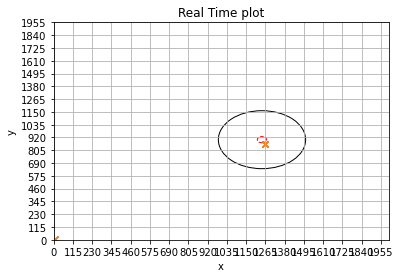

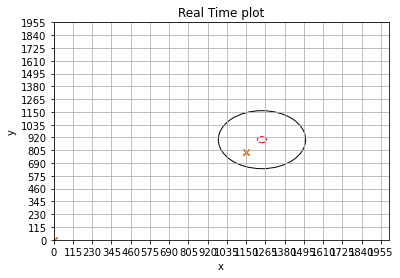

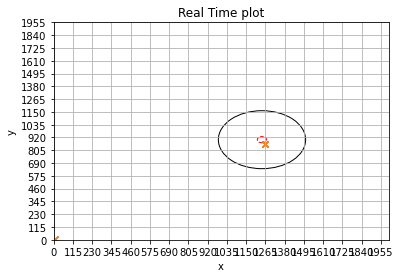

In [4]:
n = 1 #start at trial 1
i = 1 #start at point 1
w = 0 #start at zero wins
x,y = grab_location(_)
#center_piezo()
moveXY(circle_x-x,circle_y-y) #send the piezo back to the center
x,y = grab_location(fulllist)

<IPython.core.display.Javascript object>

,original_pos_xy,Final_pos_xy,max_xy,min_xy,Radius_x,Radius_y,Area
0,"(9.904499999999999, 8.5185)","([9.904499999999999], [8.500499999999999])","(9.904499999999999, 8.5185)","(9.904499999999999, 8.500499999999999)",0.0,0.009,0.0


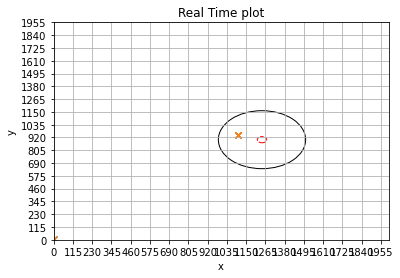

Trying this point again...Trial # 10
Try limit reached. Moving on to the next point...
AutoTest complete.


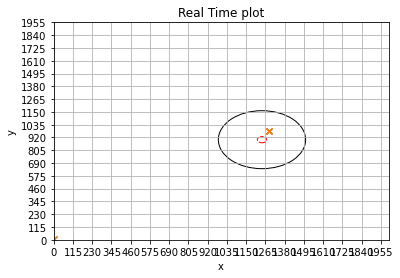

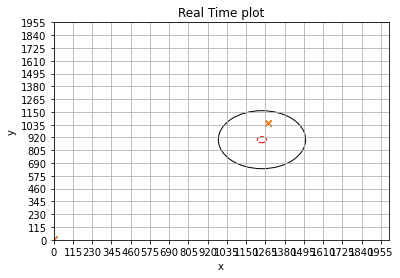

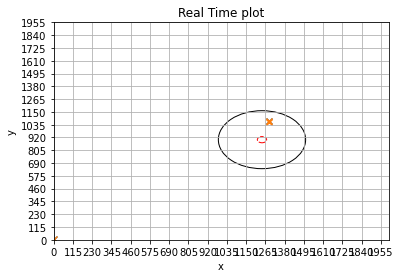

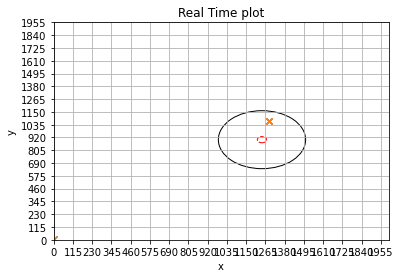

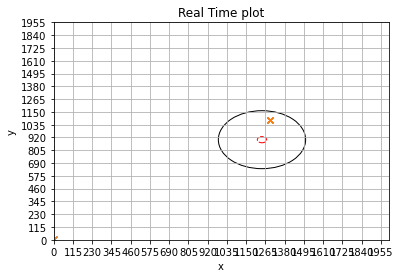

...

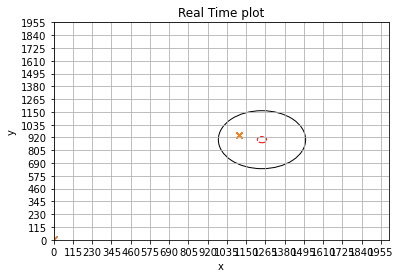

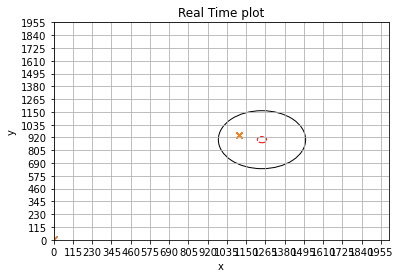

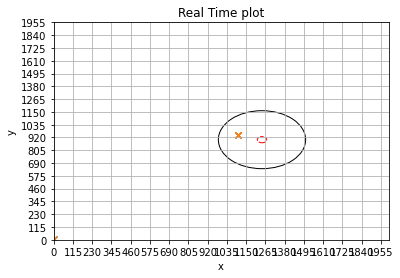

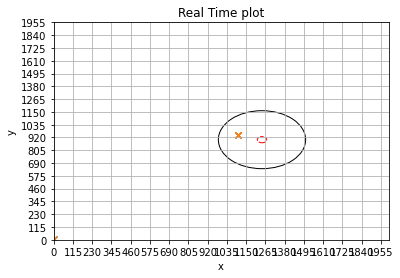

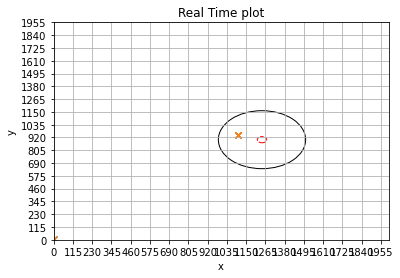

In [5]:
while i <= int(points):
    print('Point #',i)
    #x,y = grab_location(name) #add new location to CSV
    #time.sleep(1)
    
    dx = randxs[i-1] - x #distance to move in each axis
    dy = randys[i-1] - y
    
    dict = {'X (mm)': [randxs[i-1]], 'Y (mm)': [randys[i-1]]} #add the destination point to the CSV every time
    df = pd.DataFrame(dict)
    df.to_csv('.\Results\%s.csv' % fulllist, mode='a', index=False, header=False)
    
    try:
        moveXY(dx,dy) #move toward the destination
    except visa.VisaIOError:
        break
    x,y = grab_location(fulllist) #grab 'final' locaion
    
    if np.sqrt((float(randxs[i-1])-float(x))**2 + (float(randys[i-1])-float(y))**2) <= 0.05: #check if destination reached
        print("Win condition met.")
        i += 1 #go to next point
        n = 1 #reset trial counter
        w += 1
        
        dict = {'X (mm)': [x], 'Y (mm)': [y]} #add win point
        df = pd.DataFrame(dict)
        df.to_csv('.\Results\%s.csv' % winlist, mode='a', index=False, header=False)
    else:
        print('Trying this point again...Trial #',n) #else attempt point again
        n += 1 #increase trial count
    
    if n > int(trials):
        print('Try limit reached. Moving on to the next point...') #unless trial limit reached, move on to next point
        n = 1 #reset trial counter
        i += 1 #go to next point
        
        dict = {'X (mm)': [x], 'Y (mm)': [y]} #add win point
        df = pd.DataFrame(dict)
        df.to_csv('.\Results\%s.csv' % losslist, mode='a', index=False, header=False)
    
else:
    print('AutoTest complete.') #end after all points attempted

In [6]:
print('Final win count:',w,'/',points)


Final win count: 47 / 100
